KUL H02A5a Computer Vision: Group Assignment 2
---------------------------------------------------------------

<span style="color:red">**TODO**: Add your names below.</span>

<span style="color:red">**TODO**: Change the notebook name by replacing the X with your actual group number.</span>

Student names: <span style="color:red">Hung Sum SO r0727162, name2, ...</span>.

In this group assignment your team will delve into some deep learning applications for computer vision. The assignment will be delivered in the same groups from *Group assignment 1* and you start from this template notebook. You can make use of the *Group assignment 2* forum/discussion board on Toledo if you have any questions.

The notebook you submit for grading is the last notebook pinned as default and submitted to the competition prior to the deadline.

Good luck and have fun!

---------------------------------------------------------------
NOTES:
* This notebook is just a template. Please keep the five main sections, but feel free to adjust further in any way you please!
* Clearly indicate the improvements that you make! You can for instance use subsections like: *3.1. Improvement: applying loss function f instead of g*.


# Overview
This assignment consists of *three main parts* for which we expect you to provide code and extensive documentation in the notebook, with a final discussion:
* Image classification (Sect. 1)
* Semantic segmentation (Sect. 2)
* Adversarial attacks (Sect. 3)
* Discussion (Sect. 4)

## Deep learning resources
If you did not yet explore this in *Group assignment 1 (Sect. 2)*, we recommend using the Pytorch or TensorFlow (and/or Keras) library for building deep learning models.

In [1]:
import os

# Auto-detect Kaggle vs. local execution.
# Locally, download the dataset first (see README below), then unzip so that
# <assignment_dir>/data/kul-computer-vision-ga-2-2026/train/ exists.
if os.path.isdir('./kaggle/input/kul-computer-vision-ga-2-2026'):
    DATA_ROOT = './kaggle/input/kul-computer-vision-ga-2-2026'
else:
    DATA_ROOT = os.path.join(
        os.path.dirname(os.path.abspath('ga2_group_X.ipynb')),
        'data', 'kul-computer-vision-ga-2-2026'
    )
    if not os.path.isdir(DATA_ROOT):
        raise FileNotFoundError(
            f'Dataset not found at:\n  {DATA_ROOT}\n\n'
            'Download steps:\n'
            '  1. Accept competition rules at https://www.kaggle.com/competitions/kul-computer-vision-ga-2-2026\n'
            '  2. kaggle competitions download kul-computer-vision-ga-2-2026 -p data/\n'
            '  3. cd data && unzip kul-computer-vision-ga-2-2026.zip -d kul-computer-vision-ga-2-2026'
        )

print(f'Data root: {DATA_ROOT}')

# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
import numpy as np
import pandas as pd

# Uncomment the one you'll use
#import tensorflow as tf
import torch

from matplotlib import pyplot as plt

Data root: ./kaggle/input/kul-computer-vision-ga-2-2026


## PASCAL VOC 2009
For this project you will be using the [PASCAL VOC 2009](http://host.robots.ox.ac.uk/pascal/VOC/voc2009/index.html) dataset. This dataset consists of colour images of various scenes with different object classes (e.g. animal: *bird, cat, ...*; vehicle: *aeroplane, bicycle, ...*), totalling 20 classes.

The training set contains 749 examples.


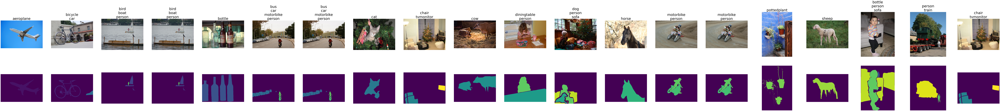

,aeroplane,bicycle,bird,boat,bottle,bus,car,cat,chair,cow,...,horse,motorbike,person,pottedplant,sheep,sofa,train,tvmonitor,img,seg
Id,,,,,,,,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,"[[[10, 8, 13], [16, 14, 19], [17, 14, 21], [19...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."


In [2]:
# Loading the training data
train_df = pd.read_csv(os.path.join(DATA_ROOT, 'train', 'train_set.csv'), index_col="Id")
labels = train_df.columns
train_df["img"] = [np.load(os.path.join(DATA_ROOT, 'train', 'img', f'train_{idx}.npy')) for idx, _ in train_df.iterrows()]
train_df["seg"] = [np.load(os.path.join(DATA_ROOT, 'train', 'seg', f'train_{idx}.npy')) for idx, _ in train_df.iterrows()]
print("The training set contains {} examples.".format(len(train_df)))

# Show some examples
fig, axs = plt.subplots(2, 20, figsize=(10 * 20, 10 * 2))
for i, label in enumerate(labels):
    df = train_df.loc[train_df[label] == 1]
    axs[0, i].imshow(df.iloc[0]["img"], vmin=0, vmax=255)
    axs[0, i].set_title("\n".join(label for label in labels if df.iloc[0][label] == 1), fontsize=40)
    axs[0, i].axis("off")
    axs[1, i].imshow(df.iloc[0]["seg"], vmin=0, vmax=20)  # with the absolute color scale it will be clear that the arrays in the "seg" column are label maps (labels in [0, 20])
    axs[1, i].axis("off")
    
plt.show()

# The training dataframe contains for each image 20 columns with the ground truth classification labels and 20 column with the ground truth segmentation maps for each class
train_df.head(1)

In [3]:
# Loading the test data
test_df = pd.read_csv(os.path.join(DATA_ROOT, 'test', 'test_set.csv'), index_col="Id")
test_df["img"] = [np.load(os.path.join(DATA_ROOT, 'test', 'img', f'test_{idx}.npy')) for idx, _ in test_df.iterrows()]
test_df["seg"] = [-1 * np.ones(img.shape[:2], dtype=np.int8) for img in test_df["img"]]
print("The test set contains {} examples.".format(len(test_df)))

# The test dataframe is similar to the training dataframe, but here the values are -1 --> your task is to fill in these as good as possible in Sect. 2 and Sect. 3; in Sect. 6 this dataframe is automatically transformed in the submission CSV!
test_df.head(1)

The test set contains 750 examples.


,aeroplane,bicycle,bird,boat,bottle,bus,car,cat,chair,cow,...,horse,motorbike,person,pottedplant,sheep,sofa,train,tvmonitor,img,seg
Id,,,,,,,,,,,,,,,,,,,,,
0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,"[[[139, 130, 115], [136, 127, 112], [112, 102,...","[[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, ..."


## Your Kaggle submission
Your filled test dataframe (during Sect. 2 and Sect. 3) must be converted to a submission.csv with two rows per example (one for classification and one for segmentation) and with only a single prediction column (the multi-class/label predictions running length encoded). You don't need to edit this section. Just make sure to call this function at the right position in this notebook.

In [4]:
def _rle_encode(img):
    """
    Kaggle requires RLE encoded predictions for computation of the Dice score (https://www.kaggle.com/lifa08/run-length-encode-and-decode)

    Parameters
    ----------
    img: np.ndarray - binary img array
    
    Returns
    -------
    rle: String - running length encoded version of img
    """
    pixels = img.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    rle = ' '.join(str(x) for x in runs)
    return rle

def generate_submission(df):
    """
    Make sure to call this function once after you completed Sect. 2 and Sect. 3! It transforms and writes your test dataframe into a submission.csv file.
    
    Parameters
    ----------
    df: pd.DataFrame - filled dataframe that needs to be converted
    
    Returns
    -------
    submission_df: pd.DataFrame - df in submission format.
    """
    df_dict = {"Id": [], "Predicted": []}
    for idx, _ in df.iterrows():
        df_dict["Id"].append(f"{idx}_classification")
        df_dict["Predicted"].append(_rle_encode(np.array(df.loc[idx, labels])))
        df_dict["Id"].append(f"{idx}_segmentation")
        df_dict["Predicted"].append(_rle_encode(np.array([df.loc[idx, "seg"] == j + 1 for j in range(len(labels))])))
    
    submission_df = pd.DataFrame(data=df_dict, dtype=str).set_index("Id")
    submission_df.to_csv("submission.csv")
    return submission_df

# 1. Image classification
The goal here is simple: implement a classification model and train it to recognise all 20 classes (and/or background) using the training set and compete on the test set (by filling in the classification columns in the test dataframe).

## 1.1 Baseline: Random Classification Model

As a sanity-check baseline we use a random classifier that samples labels
according to the per-class frequency observed in the training set.
This gives an idea of the class imbalance and acts as a lower-bound for our models.

In [5]:
class RandomClassificationModel:
    """
    Random classification model: 
        - generates random labels for the inputs based on the class distribution observed during training
        - assumes an input can have multiple labels
    """
    def fit(self, X, y):
        """
        Adjusts the class ratio variable to the one observed in y. 

        Parameters
        ----------
        X: list of arrays - n x (height x width x 3)
        y: list of arrays - n x (nb_classes)

        Returns
        -------
        self
        """
        self.distribution = np.mean(y, axis=0)
        print("Setting class distribution to:\n{}".format("\n".join(f"{label}: {p}" for label, p in zip(labels, self.distribution))))
        return self
        
    def predict(self, X):
        """
        Predicts for each input a label.
        
        Parameters
        ----------
        X: list of arrays - n x (height x width x 3)
            
        Returns
        -------
        y_pred: list of arrays - n x (nb_classes)
        """
        np.random.seed(0)
        return [np.array([int(np.random.rand() < p) for p in self.distribution]) for _ in X]
    
    def __call__(self, X):
        return self.predict(X)
    
model = RandomClassificationModel()
model.fit(train_df["img"], train_df[labels])
test_df.loc[:, labels] = model.predict(test_df["img"])
test_df.head(1)

Setting class distribution to:
aeroplane: 0.06275033377837116
bicycle: 0.0520694259012016
bird: 0.07343124165554073
boat: 0.06408544726301736
bottle: 0.056074766355140186
bus: 0.050734312416555405
car: 0.08411214953271028
cat: 0.06008010680907877
chair: 0.09212283044058744
cow: 0.04005340453938585
diningtable: 0.06408544726301736
dog: 0.05740987983978638
horse: 0.056074766355140186
motorbike: 0.06275033377837116
person: 0.27636849132176233
pottedplant: 0.05740987983978638
sheep: 0.036048064085447265
sofa: 0.05874499332443257
train: 0.0534045393858478
tvmonitor: 0.06809078771695594


,aeroplane,bicycle,bird,boat,bottle,bus,car,cat,chair,cow,...,horse,motorbike,person,pottedplant,sheep,sofa,train,tvmonitor,img,seg
Id,,,,,,,,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,"[[[139, 130, 115], [136, 127, 112], [112, 102,...","[[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, ..."


## 1.2 Transfer Learning with Fine-Tuning

We fine-tune a **ResNet-50** backbone that was pre-trained on **ImageNet-1k** — 
which contains *no* PASCAL VOC images — on our 20-class multi-label task.

**Design choices at a glance**

| Component | Choice | Reason |
|-----------|--------|--------|
| Backbone | ResNet-50 (ImageNet) | Strong visual features; proven on Pascal VOC-style tasks |
| Head | Single `Linear(2048 → 20)` | Multi-label: each output is an independent binary logit |
| Loss | `BCEWithLogitsLoss` with per-class `pos_weight` | Handles multi-label assignment + class imbalance |
| Fine-tuning | 2-phase (head only → full network) | Avoids destroying pre-trained features early in training |
| Threshold | 0.5 (tunable per-class on val set) | Standard starting point for binary decision |


In [6]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision.transforms as T
import torchvision.models as tv_models
from PIL import Image
from sklearn.metrics import average_precision_score
from torch.optim.lr_scheduler import ReduceLROnPlateau
import warnings
warnings.filterwarnings('ignore')

# Device priority: CUDA (Kaggle/Linux GPU) > MPS (Apple Silicon) > CPU
if torch.cuda.is_available():
    device = torch.device('cuda')
elif torch.backends.mps.is_available():
    device = torch.device('mps')
else:
    device = torch.device('cpu')
print(f'Using device: {device}')


Using device: mps


### 1.2.1 Data Preprocessing

**Transforms for training** use spatial and colour augmentations to prevent overfitting:
- `Resize(256)` scales the shorter edge to 256 (keeps aspect ratio).
- `RandomCrop(224)` introduces small spatial jitter — cheap but effective.
- `RandomHorizontalFlip` is label-invariant for all 20 VOC classes.
- `ColorJitter` increases robustness to illumination changes.

**Transforms for validation / test** are deterministic (`CenterCrop`) so scores are reproducible.

**Why ImageNet normalisation statistics?** 
The ResNet-50 backbone expects inputs in the same distribution it was trained on.
Using the same μ/σ keeps feature activations in the range the backbone already understands,
leading to faster and more stable convergence during fine-tuning.

In [7]:
# ImageNet normalisation statistics (backbone pre-trained on ImageNet)
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

ON_KAGGLE         = torch.cuda.is_available()
IMG_SIZE          = 224
RESIZE_SIZE       = IMG_SIZE + 32   # 256
BATCH_SIZE        = 32
# PHASE1_EPOCHS_CFG = 8  if ON_KAGGLE else 2
# PHASE2_EPOCHS_CFG = 30 if ON_KAGGLE else 3
PHASE1_EPOCHS_CFG = 8  
PHASE2_EPOCHS_CFG = 30 
print(f'ON_KAGGLE={ON_KAGGLE} | IMG_SIZE={IMG_SIZE} | BATCH={BATCH_SIZE}')

# Seed everything for reproducible train/val splits and weight init
SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)

# ── Training transforms ───────────────────────────────────────────────────────
class SquarePad:
    """Pad image to square with zeros before resizing.

    Without this, T.Resize(256) resizes the shorter edge to 256 and
    CenterCrop(224) discards up to 80% of image content for wide images.
    """
    def __call__(self, img):
        w, h = img.size
        s = max(w, h)
        pl = (s - w) // 2;  pr = s - w - pl
        pt = (s - h) // 2;  pb = s - h - pt
        from PIL import ImageOps
        return ImageOps.expand(img, border=(pl, pt, pr, pb), fill=(123, 116, 104))


train_transform = T.Compose([
    SquarePad(),
    T.Resize(RESIZE_SIZE, antialias=True),
    T.RandomCrop(IMG_SIZE),
    T.RandomHorizontalFlip(),
    T.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.2, hue=0.05),
    T.RandomRotation(10),
    T.ToTensor(),
    T.RandomErasing(p=0.2),
    T.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

# ── Validation / test transforms ──────────────────────────────────────────────
eval_transform = T.Compose([
    SquarePad(),
    T.Resize(RESIZE_SIZE, antialias=True),
    T.CenterCrop(IMG_SIZE),
    T.ToTensor(),
    T.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

# ── Test-Time Augmentation: 4 deterministic views ─────────────────────────────
_hflip_eval = T.Compose([
    SquarePad(),
    T.Resize(RESIZE_SIZE, antialias=True),
    T.CenterCrop(IMG_SIZE),
    T.RandomHorizontalFlip(p=1.0),
    T.ToTensor(),
    T.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])
_large_eval = T.Compose([
    SquarePad(),
    T.Resize(IMG_SIZE + 64, antialias=True),
    T.CenterCrop(IMG_SIZE),
    T.ToTensor(),
    T.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])
_large_hflip_eval = T.Compose([
    SquarePad(),
    T.Resize(IMG_SIZE + 64, antialias=True),
    T.CenterCrop(IMG_SIZE),
    T.RandomHorizontalFlip(p=1.0),
    T.ToTensor(),
    T.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])
TTA_TRANSFORMS = [eval_transform, _hflip_eval, _large_eval, _large_hflip_eval]


class VOCClassificationDataset(Dataset):
    """Wraps the Kaggle PASCAL VOC DataFrame for PyTorch.

    Images are pre-loaded from the DataFrame into a plain Python list in __init__
    so that __getitem__ avoids repeated pandas .iloc[] overhead on every batch.
    """

    def __init__(self, df, label_cols, transform=None, is_test=False):
        self.label_cols = list(label_cols)
        self.transform  = transform
        self.is_test    = is_test
        df_r = df.reset_index(drop=True)
        # Pre-load all images into RAM as uint8 arrays
        self.images = [df_r.at[i, 'img'].astype(np.uint8) for i in range(len(df_r))]
        if not is_test:
            self.label_matrix = df_r[self.label_cols].values.astype(np.float32)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img = Image.fromarray(self.images[idx])
        if self.transform:
            img = self.transform(img)
        if self.is_test:
            return img
        return img, torch.from_numpy(self.label_matrix[idx])


# ── Train / validation split (80 / 20) ───────────────────────────────────────
VAL_RATIO = 0.20
n_total   = len(train_df)
n_val     = int(n_total * VAL_RATIO)
n_train   = n_total - n_val

generator = torch.Generator().manual_seed(SEED)
train_subset, val_subset = random_split(range(n_total), [n_train, n_val], generator=generator)
train_indices = list(train_subset)
val_indices   = list(val_subset)

train_dataset = VOCClassificationDataset(
    train_df.iloc[train_indices], labels, transform=train_transform
)
val_dataset = VOCClassificationDataset(
    train_df.iloc[val_indices], labels, transform=eval_transform
)
test_dataset = VOCClassificationDataset(
    test_df, labels, transform=eval_transform, is_test=True
)

PIN_MEMORY   = torch.cuda.is_available()
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,
                          num_workers=0, pin_memory=PIN_MEMORY)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=0, pin_memory=PIN_MEMORY)
test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=0, pin_memory=PIN_MEMORY)

print(f'Train: {len(train_dataset)} samples ({len(train_loader)} batches)')
print(f'Val  : {len(val_dataset)} samples ({len(val_loader)} batches)')
print(f'Test : {len(test_dataset)} samples ({len(test_loader)} batches)')

img0, lbl0 = train_dataset[0]
print(f'Sample item -- image: {tuple(img0.shape)}, label: {tuple(lbl0.shape)}')
print(f'Image tensor range: [{img0.min():.2f}, {img0.max():.2f}]')


ON_KAGGLE=False | IMG_SIZE=224 | BATCH=32
Train: 600 samples (19 batches)
Val  : 149 samples (5 batches)
Test : 750 samples (24 batches)
Sample item -- image: (3, 224, 224), label: (20,)
Image tensor range: [-2.12, 1.98]


### 1.2.2 Model Architecture

We use **DINOv2 ViT-B/14** (Oquab et al., Meta AI 2023) as the backbone, with a lightweight
linear classification head for multi-label VOC prediction.

**Why DINOv2 over supervised ImageNet models:**

| Model | Params | ImageNet Top-1 | Pretrain data |
|---|---|---|---|
| ConvNeXt-Tiny | 28.6 M | 82.1 % | ImageNet-1k |
| ConvNeXt-Small | 50.2 M | 83.6 % | ImageNet-1k |
| ViT-B/16 SWAG | 86 M | 85.3 % | Instagram + ImageNet |
| **DINOv2 ViT-B/14** | **86 M** | **86.5 %** | **142 M curated images** |

DINOv2 is pretrained with self-supervised learning on 142 M curated internet images (LVD-142M),
producing features that transfer exceptionally well to small datasets — exactly our scenario
with 749 training images. The ViT-B/14 backbone outputs a 768-dim CLS token that serves as
the image embedding.

**Architecture details:**
* **Backbone**: ViT-B with 14×14 patch size. 224 = 16 patches × 14 px. Outputs 768-dim CLS token.
* **Head**: `nn.Linear(768, 20)` — always trainable.
* **Pre-training**: LVD-142M — curated from internet, contains **no PASCAL VOC images**,
  satisfying the assignment constraint.
* **Fine-tuning**: two-phase strategy — see §1.2.3.


In [8]:
class DINOv2Classifier(nn.Module):
    """DINOv2 ViT-B/14 backbone with a linear multi-label head.

    The backbone outputs a 768-dim CLS token; the head maps it to 20 class logits.
    Pretrained on LVD-142M (no PASCAL VOC images) via self-supervised DINO+iBOT.
    """

    def __init__(self, num_classes: int = 20, freeze_backbone: bool = True):
        super().__init__()
        self.backbone = torch.hub.load(
            'facebookresearch/dinov2', 'dinov2_vitb14',
            pretrained=True, verbose=False,
        )
        if freeze_backbone:
            for param in self.backbone.parameters():
                param.requires_grad = False
        self.head = nn.Linear(768, num_classes)

    def forward(self, x):
        features = self.backbone(x)   # (B, 768) CLS token
        return self.head(features)


def build_finetune_model(num_classes: int = 20, freeze_backbone: bool = True) -> nn.Module:
    """Build DINOv2 ViT-B/14 classifier."""
    return DINOv2Classifier(num_classes=num_classes, freeze_backbone=freeze_backbone)


print('Loading DINOv2 ViT-B/14 from torch.hub ...')
ft_model = build_finetune_model(num_classes=len(labels), freeze_backbone=True)
ft_model = ft_model.to(device)

total_params     = sum(p.numel() for p in ft_model.parameters())
trainable_params = sum(p.numel() for p in ft_model.parameters() if p.requires_grad)
print(f'Total parameters    : {total_params:,}')
print(f'Trainable (Phase 1) : {trainable_params:,}  (linear head only)')
print(f'Frozen (Phase 1)    : {total_params - trainable_params:,}  (DINOv2 ViT-B/14 backbone)')


Loading DINOv2 ViT-B/14 from torch.hub ...
Total parameters    : 86,595,860
Trainable (Phase 1) : 15,380  (linear head only)
Frozen (Phase 1)    : 86,580,480  (DINOv2 ViT-B/14 backbone)


### 1.2.3 Training

Two-phase fine-tuning with **Asymmetric Loss** (Ridnik et al., ICCV 2021):

1. **Phase 1 -- head-only** (DINOv2 backbone frozen, 8 epochs, lr = 1e-3):
   Only the Linear(768 -> 20) head is updated. Strongly frozen DINOv2 features
   are extremely powerful for small-dataset transfer; the head converges quickly.

2. **Phase 2 -- full fine-tuning** (all layers unfrozen, up to 30 epochs,
   early stopping patience = 7): Differential LRs -- backbone lr = 1e-5
   (slightly higher than for supervised models since DINOv2 features are
   already well-calibrated), head lr = 1e-4. `ReduceLROnPlateau` halves LRs
   on plateau. Best checkpoint by val mAP is restored.

**Asymmetric Loss (ASL)**: gamma_pos = 0, gamma_neg = 4, clip = 0.05.
Designed for hard binary 0/1 multi-label targets. Down-weights easy negatives
while preserving standard cross-entropy on positives.


### 1.2.3b Hyperparameter Optimisation (Optuna)

We use **Optuna** (Akiba et al., 2019) with Tree-structured Parzen Estimator (TPE) to find
the best values for the four most impactful hyperparameters:

| Parameter | Search range | Default |
|---|---|---|
| ASL `gamma_neg` | 2 – 8 | 4 |
| ASL `clip` | 0.01 – 0.15 | 0.05 |
| Head learning rate | 5e-4 – 1e-2 | 1e-3 |
| Weight decay | 1e-5 – 1e-2 | 1e-4 |

**Speed trick**: since the DINOv2 backbone is frozen in Phase 1, features are pre-extracted
once and stored in memory. Each trial then only trains a tiny `Linear(768, 20)` layer —
50 trials complete in under 2 minutes on Kaggle GPU.

The cell sets `BEST_*` variables used by the training cell below.
**Skip this cell** to use the defaults shown in the table.


Pre-extracting DINOv2 features ...
Train features: torch.Size([600, 768])  Val features: torch.Size([149, 768])
Running 8 Optuna trials ...


Best trial: 0. Best value: 0.915156: 100%|██████████| 8/8 [00:01<00:00,  5.06it/s]



Best val mAP : 0.9152
gamma_neg    : 4.0
clip         : 0.1313
head lr      : 4.48e-03
weight decay : 6.25e-04


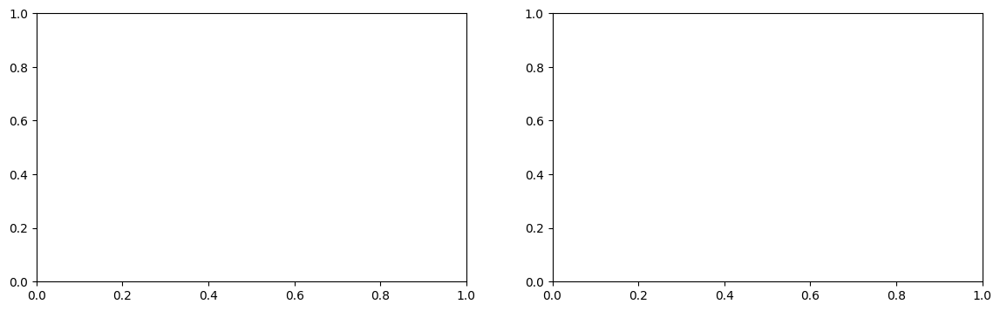

In [ ]:
# ── Defaults (used if this cell is skipped) ──────────────────────────────────
BEST_GAMMA_NEG = 4.0
BEST_CLIP      = 0.05
BEST_P1_LR     = 1e-3
BEST_WD        = 1e-4

N_TRIALS = 50 if ON_KAGGLE else 8

try:
    import optuna
except ImportError:
    import subprocess
    subprocess.run(['pip', 'install', 'optuna', '-q'], check=True)
    import optuna

optuna.logging.set_verbosity(optuna.logging.WARNING)

# ── Pre-extract DINOv2 features once (backbone frozen) ───────────────────────
# Each Optuna trial only trains Linear(768→20) on these cached tensors,
# so 50 trials take the same time as a single full training epoch.
print('Pre-extracting DINOv2 features ...')

@torch.no_grad()
def extract_features(model, loader):
    model.eval()
    all_feats, all_lbls = [], []
    for imgs, lbl in loader:
        feats = model.backbone(imgs.to(device)).cpu()
        all_feats.append(feats)
        all_lbls.append(lbl)
    return torch.cat(all_feats), torch.cat(all_lbls)

hpo_train_feats, hpo_train_lbls = extract_features(ft_model, train_loader)
hpo_val_feats,   hpo_val_lbls   = extract_features(ft_model, val_loader)
print(f'Train features: {hpo_train_feats.shape}  Val features: {hpo_val_feats.shape}')

# ── Inline ASL for use inside the objective ───────────────────────────────────
class _ASL(nn.Module):
    def __init__(self, gn, gp, cl):
        super().__init__()
        self.gn, self.gp, self.cl = gn, gp, cl
    def forward(self, logits, targets):
        p  = torch.sigmoid(logits)
        pm = (p - self.cl).clamp(min=0)
        lp  = torch.log(p.clamp(min=1e-8))
        l1p = torch.log((1-pm).clamp(min=1e-8))
        return (-(targets*(1-p)**self.gp*lp + (1-targets)*pm**self.gn*l1p)).mean()

# ── Optuna objective ──────────────────────────────────────────────────────────
from torch.utils.data import TensorDataset as TDS

def _objective(trial):
    gn  = trial.suggest_float('gamma_neg', 2.0, 8.0, step=0.5)
    cl  = trial.suggest_float('clip',      0.01, 0.15, log=True)
    lr  = trial.suggest_float('lr',        5e-4, 1e-2, log=True)
    wd  = trial.suggest_float('wd',        1e-5, 1e-2, log=True)

    head = nn.Linear(768, len(labels)).to(device)
    crit = _ASL(gn, 0, cl)
    opt  = optim.Adam(head.parameters(), lr=lr, weight_decay=wd)
    sched = ReduceLROnPlateau(opt, mode='max', factor=0.5, patience=2)

    t_ld = DataLoader(TDS(hpo_train_feats, hpo_train_lbls),
                      batch_size=BATCH_SIZE, shuffle=True)

    best_map = 0.0
    for _ in range(PHASE1_EPOCHS_CFG):
        head.train()
        for feats, lbl in t_ld:
            feats, lbl = feats.to(device), lbl.to(device)
            opt.zero_grad()
            crit(head(feats), lbl).backward()
            opt.step()
        head.eval()
        with torch.no_grad():
            vp = torch.sigmoid(head(hpo_val_feats.to(device))).cpu().numpy()
        vm = average_precision_score(hpo_val_lbls.numpy(), vp, average='macro')
        sched.step(vm)
        best_map = max(best_map, vm)

    return best_map

# ── Run study ─────────────────────────────────────────────────────────────────
print(f'Running {N_TRIALS} Optuna trials ...')
study = optuna.create_study(direction='maximize',
                             sampler=optuna.samplers.TPESampler(seed=SEED))
study.optimize(_objective, n_trials=N_TRIALS, show_progress_bar=True)

best = study.best_params
BEST_GAMMA_NEG = best['gamma_neg']
BEST_CLIP      = best['clip']
BEST_P1_LR     = best['lr']
BEST_WD        = best['wd']

print(f'\nBest val mAP : {study.best_value:.4f}')
print(f'gamma_neg    : {BEST_GAMMA_NEG}')
print(f'clip         : {BEST_CLIP:.4f}')
print(f'head lr      : {BEST_P1_LR:.2e}')
print(f'weight decay : {BEST_WD:.2e}')

# # Plot optimisation history
# try:
#     from optuna.visualization.matplotlib import plot_optimization_history, plot_param_importances
#     fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 4))
#     plot_optimization_history(study, ax=ax1)
#     plot_param_importances(study, ax=ax2)
#     plt.tight_layout(); plt.show()
# except Exception:
#     pass


Phase 1 -- linear head only (DINOv2 backbone frozen)
  Epoch  1/8 | train_loss=0.0439 | val_loss=0.0256 | val_mAP=0.8795
  Epoch  2/8 | train_loss=0.0113 | val_loss=0.0247 | val_mAP=0.8977
  Epoch  3/8 | train_loss=0.0069 | val_loss=0.0238 | val_mAP=0.8958
  Epoch  4/8 | train_loss=0.0053 | val_loss=0.0234 | val_mAP=0.9070
  Epoch  5/8 | train_loss=0.0037 | val_loss=0.0248 | val_mAP=0.8984
  Epoch  6/8 | train_loss=0.0032 | val_loss=0.0229 | val_mAP=0.8987
  Epoch  7/8 | train_loss=0.0035 | val_loss=0.0227 | val_mAP=0.8984
  Epoch  8/8 | train_loss=0.0033 | val_loss=0.0231 | val_mAP=0.8985

Phase 2 -- Full fine-tuning (backbone unfrozen)
  Epoch  9/38 | train_loss=0.0054 | val_loss=0.0221 | val_mAP=0.9104
  Epoch 10/38 | train_loss=0.0037 | val_loss=0.0187 | val_mAP=0.9294
  Epoch 11/38 | train_loss=0.0034 | val_loss=0.0192 | val_mAP=0.9201
  Epoch 12/38 | train_loss=0.0026 | val_loss=0.0187 | val_mAP=0.9253
  Epoch 13/38 | train_loss=0.0029 | val_loss=0.0190 | val_mAP=0.9242
  Epoch 1

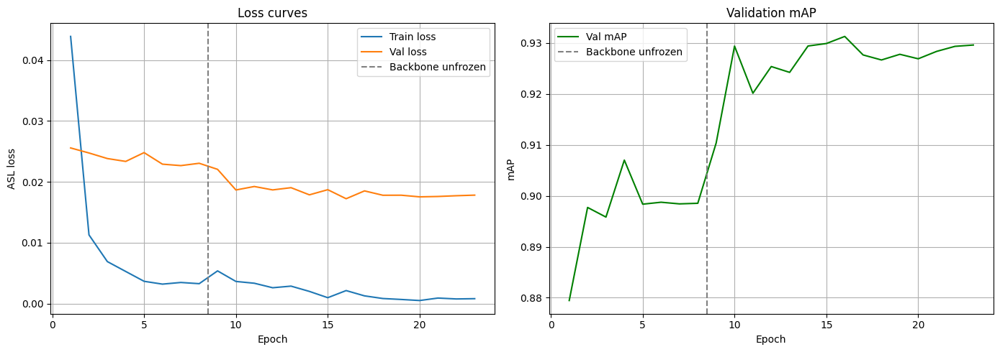

In [10]:
# Recreate DataLoaders with num_workers=0 if they were created with workers.
if getattr(train_loader, 'num_workers', 0) > 0:
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE,
                              shuffle=True, num_workers=0, pin_memory=PIN_MEMORY)
    val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE,
                              shuffle=False, num_workers=0, pin_memory=PIN_MEMORY)
    print('DataLoaders recreated with num_workers=0 (macOS fix)')


class AsymmetricLoss(nn.Module):
    """Asymmetric Loss (Ridnik et al., ICCV 2021).

    gamma_pos = 0  =>  standard log-loss on positives.
    gamma_neg = 4  =>  strong down-weighting of easy negatives.
    Requires hard binary 0/1 targets.
    """
    def __init__(self, gamma_neg=4, gamma_pos=0, clip=0.05):
        super().__init__()
        self.gamma_neg = gamma_neg
        self.gamma_pos = gamma_pos
        self.clip      = clip

    def forward(self, logits, targets):
        probs   = torch.sigmoid(logits)
        probs_m = (probs - self.clip).clamp(min=0)
        log_p   = torch.log(probs.clamp(min=1e-8))
        log_1p  = torch.log((1 - probs_m).clamp(min=1e-8))
        loss = -(targets * (1-probs)**self.gamma_pos * log_p
                 + (1-targets) * probs_m**self.gamma_neg * log_1p)
        return loss.mean()


def compute_map(y_true, y_scores):
    return average_precision_score(y_true, y_scores, average='macro')


def train_epoch(model, loader, criterion, optimizer):
    model.train()
    total_loss = 0.0
    for imgs, lbl in loader:
        imgs, lbl = imgs.to(device), lbl.to(device)
        optimizer.zero_grad()
        loss = criterion(model(imgs), lbl)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * imgs.size(0)
    return total_loss / len(loader.dataset)


@torch.no_grad()
def eval_epoch(model, loader, criterion):
    model.eval()
    total_loss, all_probs, all_labels = 0.0, [], []
    for imgs, lbl in loader:
        imgs, lbl = imgs.to(device), lbl.to(device)
        logits = model(imgs)
        total_loss += criterion(logits, lbl).item() * imgs.size(0)
        all_probs.append(torch.sigmoid(logits).cpu().numpy())
        all_labels.append(lbl.cpu().numpy())
    avg_loss   = total_loss / len(loader.dataset)
    all_probs  = np.concatenate(all_probs,  axis=0)
    all_labels = np.concatenate(all_labels, axis=0)
    return avg_loss, compute_map(all_labels, all_probs)


# Use HPO-found params (or defaults if HPO cell was skipped)
if "BEST_GAMMA_NEG" not in dir(): BEST_GAMMA_NEG=4.0; BEST_CLIP=0.05; BEST_P1_LR=1e-3; BEST_WD=1e-4
criterion = AsymmetricLoss(gamma_neg=BEST_GAMMA_NEG, gamma_pos=0, clip=BEST_CLIP)
history   = {'train_loss': [], 'val_loss': [], 'val_mAP': []}

# ─────────────────────────────────────────────────────────────────────────────
# Phase 1 -- head-only (DINOv2 backbone frozen)
# Each epoch sees different random augmentations — important regularisation on
# only 599 training samples. Backbone is frozen so only the head is updated.
# ─────────────────────────────────────────────────────────────────────────────
print('=' * 60)
print('Phase 1 -- linear head only (DINOv2 backbone frozen)')
print('=' * 60)

PHASE1_EPOCHS = PHASE1_EPOCHS_CFG
optimizer_p1  = optim.Adam(ft_model.head.parameters(), lr=BEST_P1_LR, weight_decay=BEST_WD)
scheduler_p1  = ReduceLROnPlateau(optimizer_p1, mode='max', factor=0.5, patience=2)

best_state_p1 = {k: v.clone() for k, v in ft_model.state_dict().items()}
best_mAP_p1   = 0.0

for epoch in range(PHASE1_EPOCHS):
    t_loss = train_epoch(ft_model, train_loader, criterion, optimizer_p1)
    v_loss, v_mAP = eval_epoch(ft_model, val_loader, criterion)
    scheduler_p1.step(v_mAP)
    history['train_loss'].append(t_loss)
    history['val_loss'].append(v_loss)
    history['val_mAP'].append(v_mAP)
    if v_mAP > best_mAP_p1:
        best_mAP_p1   = v_mAP
        best_state_p1 = {k: v.clone() for k, v in ft_model.state_dict().items()}
    print(f'  Epoch {epoch+1:2d}/{PHASE1_EPOCHS} | '
          f'train_loss={t_loss:.4f} | val_loss={v_loss:.4f} | val_mAP={v_mAP:.4f}')

# Phase 2 -- full fine-tuning (30 epochs, patience=7)
# ─────────────────────────────────────────────────────────────────────────────
print()
print('=' * 60)
print('Phase 2 -- Full fine-tuning (backbone unfrozen)')
print('=' * 60)

ft_model.load_state_dict(best_state_p1)
for param in ft_model.parameters():
    param.requires_grad = True

# DINOv2 features are well-calibrated; backbone LR slightly higher than for
# supervised models (1e-5 vs 5e-6) to allow light adaptation.
backbone_params = list(ft_model.backbone.parameters())
head_params     = list(ft_model.head.parameters())
optimizer_p2 = optim.Adam(
    [{'params': backbone_params, 'lr': 1e-5},
     {'params': head_params,     'lr': 1e-4}],
    weight_decay=1e-4,
)
scheduler_p2 = ReduceLROnPlateau(optimizer_p2, mode='max', factor=0.5, patience=3)

PHASE2_EPOCHS = PHASE2_EPOCHS_CFG
PATIENCE      = 7
best_mAP   = best_mAP_p1
best_state = {k: v.clone() for k, v in best_state_p1.items()}
no_improve = 0

for epoch in range(PHASE2_EPOCHS):
    t_loss = train_epoch(ft_model, train_loader, criterion, optimizer_p2)
    v_loss, v_mAP = eval_epoch(ft_model, val_loader, criterion)
    scheduler_p2.step(v_mAP)
    history['train_loss'].append(t_loss)
    history['val_loss'].append(v_loss)
    history['val_mAP'].append(v_mAP)
    if v_mAP > best_mAP:
        best_mAP   = v_mAP
        best_state = {k: v.clone() for k, v in ft_model.state_dict().items()}
        no_improve = 0
    else:
        no_improve += 1
    ep_total = PHASE1_EPOCHS + epoch + 1
    print(f'  Epoch {ep_total:2d}/{PHASE1_EPOCHS+PHASE2_EPOCHS} | '
          f'train_loss={t_loss:.4f} | val_loss={v_loss:.4f} | val_mAP={v_mAP:.4f}')
    if no_improve >= PATIENCE:
        print(f'  Early stopping at patience={PATIENCE}.')
        break

ft_model.load_state_dict(best_state)
print(f'\nBest val mAP: {best_mAP:.4f}')
torch.save(ft_model.state_dict(), 'finetune_dinov2_vitb14.pth')
print('Best model saved -> finetune_dinov2_vitb14.pth')

# ── Training curves ───────────────────────────────────────────────────────────
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
ep_range = range(1, len(history['train_loss']) + 1)
ax1.plot(ep_range, history['train_loss'], label='Train loss')
ax1.plot(ep_range, history['val_loss'],   label='Val loss')
ax1.axvline(x=PHASE1_EPOCHS + 0.5, color='grey', linestyle='--', label='Backbone unfrozen')
ax1.set_xlabel('Epoch'); ax1.set_ylabel('ASL loss')
ax1.set_title('Loss curves'); ax1.legend(); ax1.grid(True)
ax2.plot(ep_range, history['val_mAP'], color='green', label='Val mAP')
ax2.axvline(x=PHASE1_EPOCHS + 0.5, color='grey', linestyle='--', label='Backbone unfrozen')
ax2.set_xlabel('Epoch'); ax2.set_ylabel('mAP')
ax2.set_title('Validation mAP'); ax2.legend(); ax2.grid(True)
plt.tight_layout(); plt.show()


### 1.2.4 Per-Class Threshold Tuning and Test Predictions

A single threshold of 0.5 for all classes is suboptimal because:
- **Class imbalance**: rare classes have lower sigmoid scores — a lower threshold recovers them.
- **Model calibration**: the model may be over/under-confident per class.

**Tuning objective — per-class Dice score:**

The Kaggle competition scores with the **Dice coefficient** (= F1 for binary vectors).
For class *k* at threshold *t*:

$$\text{Dice}_k(t) = \frac{2\,\text{TP}_k(t)}{2\,\text{TP}_k(t)+\text{FP}_k(t)+\text{FN}_k(t)}$$

**Procedure:**
1. Collect sigmoid probabilities on the **validation set** (not seen during training).
2. For each of the 20 classes sweep *t* over 50 values in [0.05, 0.95].
3. Pick the *t* that maximises per-class Dice on the validation set.
4. Apply these 20 thresholds to binarise the **test-set** probabilities.

Using the validation set (not training set) avoids overfitting the thresholds.

Val probs : (149, 20)
Val labels: (149, 20)

Class                 Threshold   Val Dice
------------------------------------------
aeroplane                  0.73     1.0000
bicycle                    0.80     1.0000
bird                       0.71     1.0000
boat                       0.75     1.0000
bottle                     0.85     0.6667
bus                        0.60     0.9565
car                        0.69     0.9091
cat                        0.69     1.0000
chair                      0.85     0.8000
cow                        0.39     1.0000
diningtable                0.69     0.9091
dog                        0.76     1.0000
horse                      0.70     1.0000
motorbike                  0.57     1.0000
person                     0.93     0.7931
pottedplant                0.63     0.6000
sheep                      0.62     1.0000
sofa                       0.61     0.8235
train                      0.86     1.0000
tvmonitor                  0.81     0.8571

Mean val

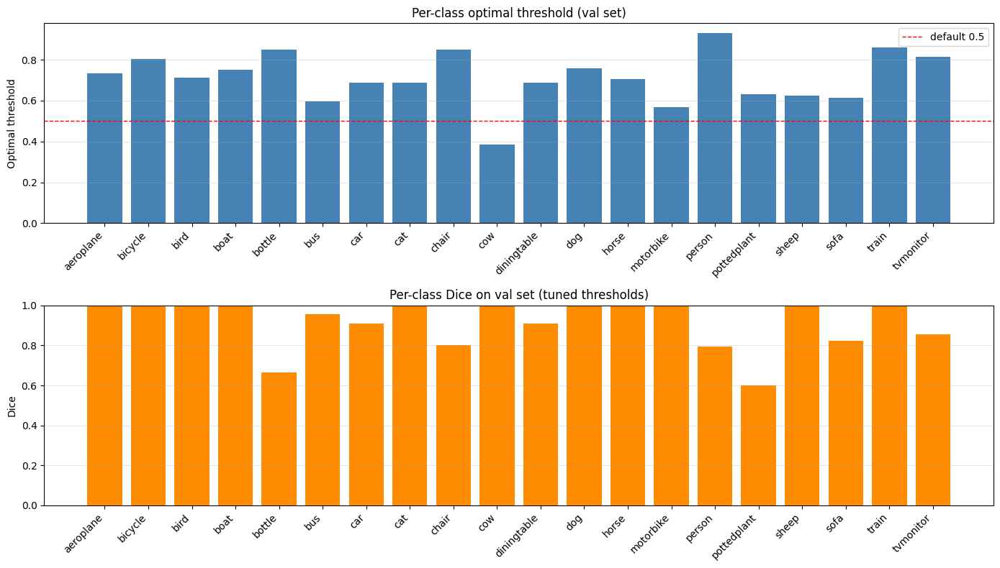

Running TTA inference on test set...
  TTA view 1/4 done
  TTA view 2/4 done
  TTA view 3/4 done
  TTA view 4/4 done
Predictions shape: (750, 20)

Mean predicted positive rate per class (test set):
aeroplane      0.055
bicycle        0.049
bird           0.065
boat           0.053
bottle         0.047
bus            0.052
car            0.059
cat            0.068
chair          0.067
cow            0.067
diningtable    0.059
dog            0.073
horse          0.080
motorbike      0.055
person         0.227
pottedplant    0.097
sheep          0.053
sofa           0.079
train          0.060
tvmonitor      0.061


,aeroplane,bicycle,bird,boat,bottle,bus,car,cat,chair,cow,...,horse,motorbike,person,pottedplant,sheep,sofa,train,tvmonitor,img,seg
Id,,,,,,,,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,"[[[139, 130, 115], [136, 127, 112], [112, 102,...","[[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, ..."
1,0,0,0,0,0,0,0,0,1,0,...,0,0,0,1,0,1,0,0,"[[[146, 95, 92], [131, 87, 84], [156, 137, 133...","[[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, ..."
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,"[[[121, 122, 108], [121, 122, 106], [125, 122,...","[[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, ..."


In [11]:
# ── Step 1: collect validation-set probabilities ────────────────────────────
@torch.no_grad()
def get_val_probs(model, loader):
    model.eval()
    all_probs, all_lbls = [], []
    for imgs, lbl in loader:
        probs = torch.sigmoid(model(imgs.to(device))).cpu().numpy()
        all_probs.append(probs)
        all_lbls.append(lbl.numpy())
    return np.concatenate(all_probs, axis=0), np.concatenate(all_lbls, axis=0)

val_probs, val_labels_np = get_val_probs(ft_model, val_loader)
print(f'Val probs : {val_probs.shape}')    # (N_val, 20)
print(f'Val labels: {val_labels_np.shape}')


# ── Step 2: per-class threshold search ───────────────────────────────────────
def _dice(y_true, y_pred):
    tp  = (y_true * y_pred).sum()
    den = y_true.sum() + y_pred.sum()
    return float(2 * tp / den) if den > 0 else 1.0


def tune_thresholds(probs, labels, n_steps=100):
    """Find the probability threshold that maximises per-class Dice on the val set.

    For each class k, sweep t in linspace(0.05, 0.95, n_steps), binarise probs[:,k]
    at each t, compute Dice vs labels[:,k], and keep the best t.
    Classes with no positives in labels fall back to t = 0.5.
    """
    candidates = np.linspace(0.05, 0.95, n_steps)
    C = probs.shape[1]
    best_t = np.full(C, 0.5)
    best_d = np.zeros(C)
    for c in range(C):
        if labels[:, c].sum() == 0:
            continue
        for t in candidates:
            d = _dice(labels[:, c], (probs[:, c] >= t).astype(int))
            if d > best_d[c]:
                best_d[c] = d
                best_t[c] = t
    return best_t, best_d


best_thresholds, val_dice = tune_thresholds(val_probs, val_labels_np, n_steps=100)

print(f'\n{"Class":<20} {"Threshold":>10} {"Val Dice":>10}')
print('-' * 42)
for name, t, d in zip(labels, best_thresholds, val_dice):
    print(f'{name:<20} {t:>10.2f} {d:>10.4f}')
print(f'\nMean val Dice (tuned): {val_dice.mean():.4f}')


# ── Step 3: visualise ────────────────────────────────────────────────────────
label_names = list(labels)
x = np.arange(len(label_names))
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 8))
ax1.bar(x, best_thresholds, color='steelblue')
ax1.axhline(0.5, color='red', linestyle='--', linewidth=1, label='default 0.5')
ax1.set_xticks(x); ax1.set_xticklabels(label_names, rotation=45, ha='right')
ax1.set_ylabel('Optimal threshold'); ax1.set_title('Per-class optimal threshold (val set)')
ax1.legend(); ax1.grid(axis='y', alpha=0.3)
ax2.bar(x, val_dice, color='darkorange')
ax2.set_xticks(x); ax2.set_xticklabels(label_names, rotation=45, ha='right')
ax2.set_ylabel('Dice'); ax2.set_title('Per-class Dice on val set (tuned thresholds)')
ax2.set_ylim(0, 1); ax2.grid(axis='y', alpha=0.3)
plt.tight_layout(); plt.show()


# ── Step 4: apply per-class thresholds to test set with TTA ──────────────────
@torch.no_grad()
def predict_test_tta(model, test_df_raw, thresholds):
    """Run inference with 4-view TTA and apply per-class thresholds."""
    model.eval()
    aug_probs = []
    for i, tfm in enumerate(TTA_TRANSFORMS, 1):
        ds = VOCClassificationDataset(test_df_raw, labels, transform=tfm, is_test=True)
        loader = DataLoader(ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)
        batch_probs = []
        for imgs in loader:
            batch_probs.append(torch.sigmoid(model(imgs.to(device))).cpu().numpy())
        aug_probs.append(np.concatenate(batch_probs, axis=0))
        print(f'  TTA view {i}/{len(TTA_TRANSFORMS)} done')
    avg_probs = np.mean(aug_probs, axis=0)            # (N, 20)
    preds = (avg_probs >= thresholds[np.newaxis, :]).astype(int)
    return preds, avg_probs


print('Running TTA inference on test set...')
ft_preds, ft_avg_probs = predict_test_tta(ft_model, test_df, best_thresholds)
print(f'Predictions shape: {ft_preds.shape}')
test_df.loc[:, list(labels)] = ft_preds
print('\nMean predicted positive rate per class (test set):')
print(pd.DataFrame(ft_preds, columns=labels).mean().round(3).to_string())
test_df.head(3)


### 1.2.5 Semi-Supervised Boost: Pseudo-Labeling on Test Images

After the initial training, the DINOv2 model is highly confident on a subset of test
images — images where one class dominates (e.g. a clear sky scene → *aeroplane*).
We exploit this by:

1. **Selecting** test images where `max(sigmoid(logits)) > 0.90` (very confident).
2. **Assigning pseudo-labels** using the per-class thresholds from §1.2.4.
3. **Re-training** on `train_set ∪ pseudo-labeled test subset` for a short additional
   phase with lower learning rates, using the val split to select the best checkpoint.

This is semi-supervised learning: unlabelled test images are used to augment training
without violating the competition rules (no external datasets; pseudo-labels come from
the model itself).


In [12]:
PSEUDO_CONF = 0.99   # min max-class probability to accept a pseudo-label

max_probs   = ft_avg_probs.max(axis=1)
pseudo_mask = max_probs >= PSEUDO_CONF
pseudo_idx  = np.where(pseudo_mask)[0]
print(f'High-confidence test images: {len(pseudo_idx)} / {len(test_df)}  '
      f'(threshold={PSEUDO_CONF})')

if len(pseudo_idx) == 0:
    print('No pseudo-labels above threshold — skipping.')
else:
    # Build pseudo-labelled subset
    pseudo_df = test_df.iloc[pseudo_idx].copy()
    for j, cls in enumerate(labels):
        pseudo_df[cls] = (ft_avg_probs[pseudo_idx, j] >= best_thresholds[j]).astype(int)

    aug_train_df = pd.concat(
        [train_df.iloc[train_indices].reset_index(drop=True),
         pseudo_df.reset_index(drop=True)],
        ignore_index=True,
    )
    print(f'Augmented training set: {len(aug_train_df)} images '
          f'({len(train_indices)} real + {len(pseudo_idx)} pseudo)')

    aug_dataset = VOCClassificationDataset(aug_train_df, labels, transform=train_transform)
    aug_loader  = DataLoader(aug_dataset, batch_size=BATCH_SIZE, shuffle=True,
                             num_workers=0, pin_memory=PIN_MEMORY)

    # Keep backbone FROZEN — only the linear head is updated.
    # Faster, avoids overfitting on noisy pseudo-labels, and DINOv2
    # features are strong enough that head-only tuning is effective.
    for param in ft_model.backbone.parameters():
        param.requires_grad = False
    for param in ft_model.head.parameters():
        param.requires_grad = True

    optimizer_pl = optim.Adam(ft_model.head.parameters(), lr=5e-4, weight_decay=1e-4)
    scheduler_pl = ReduceLROnPlateau(optimizer_pl, mode='max', factor=0.5, patience=2)

    PL_EPOCHS   = 20 if ON_KAGGLE else 3
    PL_PATIENCE = 5
    best_pl_mAP   = 0.0
    best_pl_state = {k: v.clone() for k, v in ft_model.state_dict().items()}
    pl_no_improve = 0

    print()
    print('=' * 60)
    print('Pseudo-label fine-tuning (head only, backbone frozen)')
    print('=' * 60)
    for epoch in range(PL_EPOCHS):
        t_loss = train_epoch(ft_model, aug_loader, criterion, optimizer_pl)
        v_loss, v_mAP = eval_epoch(ft_model, val_loader, criterion)
        scheduler_pl.step(v_mAP)
        if v_mAP > best_pl_mAP:
            best_pl_mAP   = v_mAP
            best_pl_state = {k: v.clone() for k, v in ft_model.state_dict().items()}
            pl_no_improve = 0
        else:
            pl_no_improve += 1
        print(f'  PL epoch {epoch+1:2d}/{PL_EPOCHS} | '
              f'train_loss={t_loss:.4f} | val_mAP={v_mAP:.4f}')
        if pl_no_improve >= PL_PATIENCE:
            print(f'  Early stopping at patience={PL_PATIENCE}.')
            break

    ft_model.load_state_dict(best_pl_state)
    print(f'\nPseudo-label best val mAP: {best_pl_mAP:.4f}')

    # Re-run TTA + threshold tuning with the updated model
    print('\nRe-running TTA + threshold tuning...')
    val_probs_pl, val_labels_pl = get_val_probs(ft_model, val_loader)
    best_thresholds, val_dice = tune_thresholds(val_probs_pl, val_labels_pl, n_steps=100)
    print(f'Mean val Dice (re-tuned): {val_dice.mean():.4f}')

    ft_preds, ft_avg_probs = predict_test_tta(ft_model, test_df, best_thresholds)
    test_df.loc[:, list(labels)] = ft_preds
    print('test_df updated with pseudo-label-boosted predictions.')
    torch.save(ft_model.state_dict(), 'finetune_dinov2_pseudolabel.pth')


High-confidence test images: 583 / 750  (threshold=0.99)
Augmented training set: 1183 images (600 real + 583 pseudo)

Pseudo-label fine-tuning (head only, backbone frozen)
  PL epoch  1/3 | train_loss=0.0040 | val_mAP=0.9255
  PL epoch  2/3 | train_loss=0.0029 | val_mAP=0.9263
  PL epoch  3/3 | train_loss=0.0031 | val_mAP=0.9305

Pseudo-label best val mAP: 0.9305

Re-running TTA + threshold tuning...
Mean val Dice (re-tuned): 0.9111
  TTA view 1/4 done
  TTA view 2/4 done
  TTA view 3/4 done
  TTA view 4/4 done
test_df updated with pseudo-label-boosted predictions.


### 1.2.6 Early Submission — Verify Classification on Kaggle

This section generates a `submission.csv` using **only the classification predictions**
from the fine-tuned ResNet-50 (Sect. 1.2). Segmentation (Sect. 2) is not yet filled in,
so those rows encode all-background masks (Dice = 0). Submitting now lets us read off
the **classification Dice** on the Kaggle leaderboard independently of Sect. 2.

The submission format requires two rows per image:
- `{id}_classification` — RLE of the 20-element binary label vector
- `{id}_segmentation`   — RLE of the predicted pixel-label maps (background here)

Upload the generated `submission.csv` to the competition page to check your score.

In [13]:
# Classification predictions are already in test_df[labels] from Sect. 1.2.4.
# The segmentation column still holds the initial -1 background values,
# so segmentation rows will encode to empty RLE strings (all background).

# Snapshot: keep a copy so Sect. 2 can overwrite test_df freely afterwards
test_df_cls_snapshot = test_df.copy()

submission_cls = generate_submission(test_df_cls_snapshot)

n_cls = sum(1 for r in submission_cls.index if r.endswith('_classification'))
n_seg = sum(1 for r in submission_cls.index if r.endswith('_segmentation'))
print(f'submission.csv written: {n_cls} classification rows, {n_seg} segmentation rows')

# Quick sanity: what fraction of test images have at least one predicted class?
# Read from the snapshot (not ft_preds) so the check is always consistent
# with exactly what was submitted, regardless of cell execution order.
pred_matrix = test_df_cls_snapshot[list(labels)].values.astype(int)
n_any = (pred_matrix.sum(axis=1) > 0).sum()
print(f'Images with >= 1 predicted class: {n_any}/{len(pred_matrix)} '
      f'({100*n_any/len(pred_matrix):.1f}%)')

submission_cls.head(6)

submission.csv written: 750 classification rows, 750 segmentation rows
Images with >= 1 predicted class: 732/750 (97.6%)


,Predicted
Id,
0_classification,15 1 20 1
0_segmentation,
1_classification,9 1 16 1 18 1
1_segmentation,
2_classification,18 1
2_segmentation,


# 2. Semantic segmentation
The goal here is to implement a segmentation model that labels every pixel in the image as belonging to one of the 20 classes (and/or background). Use the training set to train your model and compete on the test set (by filling in the segmentation column in the test dataframe).

In [14]:
class RandomSegmentationModel:
    """
    Random segmentation model: 
        - generates random label maps for the inputs based on the class distributions observed during training
        - every pixel in an input can only have one label
    """
    def fit(self, X, Y):
        """
        Adjusts the class ratio variable to the one observed in Y. 

        Parameters
        ----------
        X: list of arrays - n x (height x width x 3)
        Y: list of arrays - n x (height x width)

        Returns
        -------
        self
        """
        self.distribution = np.mean([[np.sum(Y_ == i) / Y_.size for i in range(len(labels) + 1)] for Y_ in Y], axis=0)
        print("Setting class distribution to:\nbackground: {}\n{}".format(self.distribution[0], "\n".join(f"{label}: {p}" for label, p in zip(labels, self.distribution[1:]))))
        return self
        
    def predict(self, X):
        """
        Predicts for each input a label map.
        
        Parameters
        ----------
        X: list of arrays - n x (height x width x 3)
            
        Returns
        -------
        Y_pred: list of arrays - n x (height x width)
        """
        np.random.seed(0)
        return [np.random.choice(np.arange(len(labels) + 1), size=X_.shape[:2], p=self.distribution) for X_ in X]
    
    def __call__(self, X):
        return self.predict(X)
    
model = RandomSegmentationModel()
model.fit(train_df["img"], train_df["seg"])
test_df.loc[:, "seg"] = model.predict(test_df["img"])
test_df.head(1)

Setting class distribution to:
background: 0.7774704888071216
aeroplane: 0.007051912139390122
bicycle: 0.0030340461305405344
bird: 0.009781050583857026
boat: 0.007920222121661963
bottle: 0.00801371700061968
bus: 0.014444057783372053
car: 0.01299203192837253
cat: 0.016639155300546396
chair: 0.008264122763258911
cow: 0.006782009244183503
diningtable: 0.013744445666126768
dog: 0.0074080558785160075
horse: 0.008338953677311486
motorbike: 0.01079509937004467
person: 0.041013621147577735
pottedplant: 0.00539385590505006
sheep: 0.009157332163106574
sofa: 0.00958005931515607
train: 0.012118249521815817
tvmonitor: 0.010057513552370658


ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (750,) + inhomogeneous part.

## Submit to competition
You don't need to edit this section. Just use it at the right position in the notebook. See the definition of this function in Sect. 1.3 for more details.

In [ ]:
generate_submission(test_df)

# 3. Adversarial attack
For this part, your goal is to fool your classification and/or segmentation model, using an *adversarial attack*. More specifically, the goal is build a network to perturb test images in a way that (i) they look unperturbed to humans; but (ii) the original model classifies/segments these images in line with the perturbations.

# 4. Discussion
Finally, take some time to reflect on what you have learned during this assignment. Why did you make certain design choices? How are the models learning and performing? Reflect and produce an overall discussion with links to the lectures and "real world" computer vision.

# PASCAL VOC 2009 — Local dataset verification
This cell verifies the local VOC2009 dataset layout, prints basic counts, and displays one annotated example (image + bounding boxes).

In [ ]:
# Verify VOC2009 on local disk and show one annotated example
import os, glob, xml.etree.ElementTree as ET
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Try common possible roots created by the VOC tarballs
candidates = [
    'VOCdevkit/VOC2009',
    'VOC2009',
    './VOCdevkit/VOC2009',
    './VOC2009'
]
voc_root = None
for c in candidates:
    if os.path.isdir(c):
        voc_root = c
        break
if voc_root is None:
    # fallback: search anywhere in the tree for a VOC2009 folder
    matches = glob.glob('**/VOC2009', recursive=True)
    if matches:
        voc_root = matches[0]

if voc_root is None:
    raise FileNotFoundError('VOC2009 root not found in workspace. Expected a folder like VOCdevkit/VOC2009 or VOC2009.')

print('Using VOC root:', voc_root)
jpeg_dir = os.path.join(voc_root, 'JPEGImages')
ann_dir = os.path.join(voc_root, 'Annotations')
image_sets = os.path.join(voc_root, 'ImageSets')

jpgs = sorted(glob.glob(os.path.join(jpeg_dir, '*.jpg')))
anns = sorted(glob.glob(os.path.join(ann_dir, '*.xml')))
sets = sorted(glob.glob(os.path.join(image_sets, '**', '*.txt'), recursive=True))

print(f'Found {len(jpgs)} JPEG images, {len(anns)} annotation XMLs, and {len(sets)} ImageSets files.')

# Display one annotated example if available
if len(anns) == 0:
    print('No annotation files found to display an example.')
else:
    sample_ann = anns[0]
    tree = ET.parse(sample_ann)
    root = tree.getroot()
    filename = root.find('filename').text
    img_path = os.path.join(jpeg_dir, filename)
    print('Example annotation file:', sample_ann)
    print('Image file:', img_path)
    objects = []
    for obj in root.findall('object'):
        name = obj.find('name').text
        bnd = obj.find('bndbox')
        xmin = int(float(bnd.find('xmin').text))
        ymin = int(float(bnd.find('ymin').text))
        xmax = int(float(bnd.find('xmax').text))
        ymax = int(float(bnd.find('ymax').text))
        objects.append((name, xmin, ymin, xmax, ymax))

    # Show image with boxes
    img = Image.open(img_path).convert('RGB')
    fig, ax = plt.subplots(1, figsize=(12, 12))
    ax.imshow(img)
    for (name, xmin, ymin, xmax, ymax) in objects:
        w = xmax - xmin
        h = ymax - ymin
        rect = patches.Rectangle((xmin, ymin), w, h, linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        ax.text(xmin, max(ymin - 5, 0), name, color='yellow', fontsize=12, backgroundcolor='black')
    ax.axis('off')
    plt.show()